# Machine Learning Engineer Nanodegree
## Deep Learning
## Project: Build a Digit Recognition Program

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

----
## Step 1: Design and Test a Model Architecture
Design and implement a deep learning model that learns to recognize sequences of digits. Train the model using synthetic data generated by concatenating character images from [notMNIST](http://yaroslavvb.blogspot.com/2011/09/notmnist-dataset.html) or [MNIST](http://yann.lecun.com/exdb/mnist/). To produce a synthetic sequence of digits for testing, you can for example limit yourself to sequences up to five digits, and use five classifiers on top of your deep network. You would have to incorporate an additional ‘blank’ character to account for shorter number sequences.

There are various aspects to consider when thinking about this problem:
- Your model can be derived from a deep neural net or a convolutional network.
- You could experiment sharing or not the weights between the softmax classifiers.
- You can also use a recurrent network in your deep neural net to replace the classification layers and directly emit the sequence of digits one-at-a-time.

Here is an example of a [published baseline model on this problem](http://static.googleusercontent.com/media/research.google.com/en//pubs/archive/42241.pdf). ([video](https://www.youtube.com/watch?v=vGPI_JvLoN0))

### Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [1]:
import os
import sys
from six.moves.urllib.request import urlretrieve
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import idx2numpy
import time
from scipy.io import loadmat

In [2]:
t1 = time.clock()
train_and_valid_dataset = idx2numpy.convert_from_file('Data/train-images-idx3-ubyte')
test_dataset = idx2numpy.convert_from_file('Data/t10k-images-idx3-ubyte')
train_and_valid_labels = idx2numpy.convert_from_file('Data/train-labels-idx1-ubyte')
test_labels = idx2numpy.convert_from_file('Data/t10k-labels-idx1-ubyte')
t2 = time.clock()
print('Complete in %.2f seconds.'%(t2-t1))

Complete in 4.75 seconds.


In [6]:
# Arrange training, validation, and testing sets

train_dataset = train_and_valid_dataset[:50000,:]
valid_dataset = train_and_valid_dataset[50000:,:]

train_labels = train_and_valid_labels[:50000]
valid_labels = train_and_valid_labels[50000:]

print('Training set size: {}'.format(train_dataset.shape))
print('Validation set size: {}'.format(valid_dataset.shape))
print('Testing set size: {}'.format(test_dataset.shape))

print('Training label size: {}'.format(train_labels.shape))
print('Validation label size: {}'.format(valid_labels.shape))
print('Testing label size: {}'.format(test_labels.shape))

Training set size: (50000, 28, 28)
Validation set size: (10000, 28, 28)
Testing set size: (10000, 28, 28)
Training label size: (50000,)
Validation label size: (10000,)
Testing label size: (10000,)


In [7]:
def create_sets(data, labels):
    newdata = np.ndarray(shape=(data.shape[0], data.shape[1], 5*data.shape[2]))
    newlabels = np.ndarray(shape=(data.shape[0], 5))
    blank_digit = np.zeros(shape=(28,28))
    blank_labels = np.array([10,10,10,10,10])
    
    data_index = 0
    newdata_index = 0
    while newdata_index < data.shape[0]:
        # length of sequence
        length = np.random.randint(1,5)
        
        # images of digits for sequence
        data_digits = []
        for i in range(length):
            try:
                data_digits.append(data[data_index+i,:,:])
            except:
                print(data_index, i)
        
        # labels for sequence
        label_digits = np.empty(shape=(5))
        label_digits[0:length] = labels[data_index:data_index+length]
        label_digits[length:] = blank_labels[length:]
        
        # format the data
        temp_digits = []
        for i in range(5):
            if i < length:
                temp_digits.append(data_digits[i])
            else:
                temp_digits.append(blank_digit)
        
        sequence = np.concatenate(temp_digits, axis=1)
        
        # append the formatted data to the new arrays
        newdata[newdata_index,:,:] = sequence
        newlabels[newdata_index] = label_digits
        
        # update indexes
        data_index += length
        data_index %= (data.shape[0]-5)
        newdata_index += 1
    
    return newdata, newlabels
        

In [8]:
train_dataset, train_labels = create_sets(train_dataset, train_labels)
valid_dataset, valid_labels = create_sets(valid_dataset, valid_labels)
test_dataset, test_labels = create_sets(test_dataset, test_labels)

In [10]:
num_channels = 1 # greyscale
image_size = 28
num_labels = 11
seq_length = 5

def reformat_conv(dataset, labels):
  dataset = dataset.reshape(
    (-1, image_size, seq_length*image_size, num_channels)).astype(np.float32)
  #labels = (np.arange(num_labels) == labels[:,None]).astype(np.float32)
  return dataset, labels

train_dataset, train_labels = reformat_conv(train_dataset, train_labels)
valid_dataset, valid_labels = reformat_conv(valid_dataset, valid_labels)
test_dataset, test_labels = reformat_conv(test_dataset, test_labels)
print('Training set', train_dataset.shape, train_labels.shape)
print('Validation set', valid_dataset.shape, valid_labels.shape)
print('Test set', test_dataset.shape, test_labels.shape)

Training set (50000, 28, 140, 1) (50000, 5)
Validation set (10000, 28, 140, 1) (10000, 5)
Test set (10000, 28, 140, 1) (10000, 5)


In [11]:
# TRIM VALID AND TEST SETS TO AVOID CRASHING JUPYTER
valid_dataset = valid_dataset[:2000]
valid_labels = valid_labels[:2000]
test_dataset = test_dataset[:2000]
test_labels = test_labels[:2000]

In [12]:
def elementwise_accuracy(predictions, labels):
    preds = np.transpose(np.argmax(predictions, 2))
    return 100*np.sum(preds == labels)/len(preds)/seq_length

In [13]:
def accuracy(predictions, labels):
    total = 0
    preds = np.transpose(np.argmax(predictions, 2))
    for i in range(len(preds)):
        if sum(preds[i] == labels[i]) == 5:
            total += 1
    return 100*total/len(preds)

In [14]:
batch_size = 32
patch_size = 5
depth1 = 32
depth2 = 64
num_hidden = 128
beta = 8e-3

graph = tf.Graph()

with graph.as_default():

    # Input data.
    tf_train_dataset = tf.placeholder(
        tf.float32, shape=(batch_size, image_size, image_size*seq_length, num_channels))
    tf_train_labels = tf.placeholder(tf.int32, shape=(batch_size, seq_length))
    tf_valid_dataset = tf.constant(valid_dataset)
    tf_test_dataset = tf.constant(test_dataset)
    
    # Variables
    layer1_weights = tf.get_variable("ConvW1", shape=[patch_size, patch_size, 
        num_channels, depth1], initializer=tf.contrib.layers.xavier_initializer())
    layer1_bias = tf.Variable(tf.zeros([depth1]), name="ConvB1")
    layer2_weights = tf.get_variable("ConvW2", shape=[patch_size, patch_size,
        depth1, depth2], initializer=tf.contrib.layers.xavier_initializer())
    layer2_bias = tf.Variable(tf.zeros([depth2]), name="ConvB2")
    layer3_weights = tf.get_variable("FcW1", shape=[image_size // 4 * image_size // 4 * depth2, 
        num_hidden], initializer=tf.contrib.layers.xavier_initializer())
    layer3_bias = tf.Variable(tf.zeros([num_hidden], name="FcB1"))
    layer4_weights = tf.get_variable("ClfW", shape=[num_hidden, num_labels],
        initializer=tf.contrib.layers.xavier_initializer())
    layer4_bias = tf.Variable(tf.zeros([num_labels], name="ClfB"))
    
    
    # Model.
    def model(data, dropout=False):
        
        split_data = tf.split(split_dim=2, num_split=5, value=data)
        digits = []
        
        for digit in split_data:
        
            # First convolutional layer
            conv1 = tf.nn.conv2d(digit, layer1_weights, [1, 1, 1, 1], padding='SAME')
            hidden1 = tf.nn.relu(conv1 + layer1_bias)
            pool1 = tf.nn.max_pool(hidden1, [1,2,2,1], [1,2,2,1], padding='SAME')
            
            # Second convolutional layer
            conv2 = tf.nn.conv2d(pool1, layer2_weights, [1, 1, 1, 1], padding='SAME')
            hidden2 = tf.nn.relu(conv2 + layer2_bias)
            pool2 = tf.nn.max_pool(hidden2, [1,2,2,1], [1,2,2,1], padding='SAME')
            
            # Flatten the tensor
            shape = pool2.get_shape().as_list()
            reshape = tf.reshape(pool2, [shape[0], shape[1] * shape[2] * shape[3]])
        
            # Dropout
            if dropout:
                reshape = tf.nn.dropout(reshape, keep_prob=0.6)
    
            hidden3 = tf.nn.relu(tf.matmul(reshape, layer3_weights) + layer3_bias)
    
            if dropout:
                hidden3 = tf.nn.dropout(hidden3, keep_prob=0.6)
        
            digits.append(tf.matmul(hidden3, layer4_weights) + layer4_bias)
            
        return digits
    
    #Training computation.
    train_logits = model(tf_train_dataset, dropout=True)
    loss = 0
    for i in range(5):
        loss += tf.reduce_mean(
            tf.nn.sparse_softmax_cross_entropy_with_logits(train_logits[i], tf_train_labels[:,i]))
    loss += beta*(tf.nn.l2_loss(layer1_weights)+tf.nn.l2_loss(layer2_weights)+tf.nn.l2_loss(layer3_weights)+tf.nn.l2_loss(layer4_weights))
    
    # Optimizer.
    global_step = tf.Variable(0)
    learning_rate = tf.train.exponential_decay(0.01, global_step, 
            decay_steps=500, decay_rate=0.95, staircase=True)
    optimizer = tf.train.AdamOptimizer(learning_rate).minimize(loss)
  
    # Predictions for the training, validation, and test data.
    valid_logits = model(tf_valid_dataset)
    test_logits = model(tf_test_dataset)
    for i in range(5):
        valid_logits[i] = tf.nn.softmax(valid_logits[i])
        test_logits[i] = tf.nn.softmax(test_logits[i])
    train_prediction = tf.pack(train_logits)
    valid_prediction = tf.pack(valid_logits)
    test_prediction = tf.pack(test_logits)
    
    saver = tf.train.Saver()
    
num_steps = 10001

with tf.Session(graph=graph) as session:
    tf.global_variables_initializer().run()
    #saver.restore(session, tf.train.latest_checkpoint('./'))
    print('Initialized')
    
    for step in range(num_steps):
        offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
        batch_data = train_dataset[offset:(offset + batch_size), :, :, :]
        batch_labels = train_labels[offset:(offset + batch_size), :]
        feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
        _, l, predictions = session.run(
          [optimizer, loss, train_prediction], feed_dict=feed_dict)
        if (step % 1000 == 0):
            print('Minibatch loss at step %d: %f' % (step, l))
            print('Minibatch accuracy: %.1f%%' % accuracy(predictions, batch_labels))
            print('Validation accuracy: %.1f%%' % accuracy(
                valid_prediction.eval(), valid_labels))
    print('Test accuracy: %.1f%%' % accuracy(test_prediction.eval(), test_labels))
    save_path = saver.save(session, "./tensorflowcheckpoints/sess")
    print('Model saved to {}'.format(save_path))


Initialized
Minibatch loss at step 0: 107.883690
Minibatch accuracy: 0.0%
Validation accuracy: 0.0%
Minibatch loss at step 1000: 3.003631
Minibatch accuracy: 71.9%
Validation accuracy: 87.8%
Minibatch loss at step 2000: 3.106699
Minibatch accuracy: 65.6%
Validation accuracy: 88.5%
Minibatch loss at step 3000: 2.951284
Minibatch accuracy: 62.5%
Validation accuracy: 85.2%
Minibatch loss at step 4000: 2.334377
Minibatch accuracy: 87.5%
Validation accuracy: 85.6%
Minibatch loss at step 5000: 2.820235
Minibatch accuracy: 62.5%
Validation accuracy: 89.6%
Minibatch loss at step 6000: 2.543198
Minibatch accuracy: 71.9%
Validation accuracy: 85.6%
Minibatch loss at step 7000: 2.770251
Minibatch accuracy: 65.6%
Validation accuracy: 85.1%
Minibatch loss at step 8000: 2.411674
Minibatch accuracy: 62.5%
Validation accuracy: 86.5%
Minibatch loss at step 9000: 3.147276
Minibatch accuracy: 68.8%
Validation accuracy: 86.8%
Minibatch loss at step 10000: 3.838606
Minibatch accuracy: 68.8%
Validation accur

### Question 1
_What approach did you take in coming up with a solution to this problem?_

**Answer:** 

After loading the training and testing data, I created sequences of between 1 and 5 digits. The sequences are input into the model, which is a two-layer convolutional network. I chose a convolutional network because it is an effective tool for processing images. 

The model splits the sequences into five separate digits and performs the convolutions and final connections independently, into 11 output classes representing the digits 0-9 and a blank digit, encoded with a 10.

### Question 2
_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)_

**Answer:**

The final architecture has two 5x5 convolutions with 2x2 max pooling of stride 2, followed by a fully connected layer with dropout. L2 regularization is also used.

The optimizer is Adam optimizer. I chose this one because it seems to work better than gradient descent and the momentum optimizer. 

### Question 3
_How did you train your model? How did you generate your synthetic dataset?_ Include examples of images from the synthetic data you constructed.

**Answer:**

I trained the model on sequences of variable length. The synthetic dataset is generated by the create_sets function, which selects a number between 1 and 5, and appends digits and labels from the raw dataset to numpy arrays. Some examples of training data and labels can be seen below.

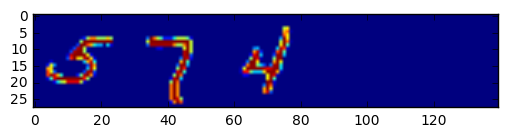

[ 5  7  4 10 10]


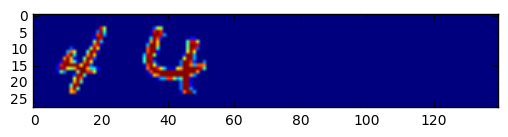

[ 4  4 10 10 10]


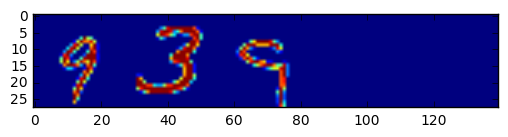

[ 9  3  9 10 10]


In [17]:
def plotnum(data):
    plt.imshow(data)
    plt.show()

for _ in range(3):
    i = np.random.randint(100,200)
    plotnum(np.squeeze(train_dataset[i]))
    print(train_labels[i].astype(np.int32))

----
## Step 2: Train a Model on a Realistic Dataset
Once you have settled on a good architecture, you can train your model on real data. In particular, the [Street View House Numbers (SVHN)](http://ufldl.stanford.edu/housenumbers/) dataset is a good large-scale dataset collected from house numbers in Google Street View. Training on this more challenging dataset, where the digits are not neatly lined-up and have various skews, fonts and colors, likely means you have to do some hyperparameter exploration to perform well.

### Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [2]:
import os
import sys
from six.moves.urllib.request import urlretrieve
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import idx2numpy
import time
from scipy.io import loadmat

In [19]:
train_data = loadmat('cropped_data/train_32x32.mat')
test_data = loadmat('cropped_data/test_32x32.mat')

In [20]:
# this converts the labels for zero to 0  [was 10]
ten_to_zero = np.vectorize(lambda x: 0 if x==10 else x)
train_data['y'] = ten_to_zero(train_data['y'])

In [21]:
train_dataset = train_data['X']
test_dataset = test_data['X']
train_labels = train_data['y']
test_labels = test_data['y']

# switch image index to first index
train_dataset = np.rollaxis(train_dataset, 3)
test_dataset = np.rollaxis(test_dataset, 3)

In [22]:
# Rearrange to [-1,1) 
train_dataset = (train_dataset / 128.0) - 1.0
test_dataset = (test_dataset / 128.0) - 1.0

# Create validation set
valid_dataset = train_dataset[0:5000, :, :, :]
valid_labels = train_labels[0:5000, :]
train_dataset = train_dataset[5000:, :, :, :]
train_labels = train_labels[5000:, :]

# Shrink Test Dataset because jupyter keeps crashing
valid_dataset = valid_dataset[:2000]
valid_labels = valid_labels[:2000]
test_dataset = test_dataset[:2000]
test_labels = test_labels[:2000]

In [23]:
print(train_dataset.shape, train_labels.shape)
print(valid_dataset.shape, valid_labels.shape)
print(test_dataset.shape, test_labels.shape)

(68257, 32, 32, 3) (68257, 1)
(2000, 32, 32, 3) (2000, 1)
(2000, 32, 32, 3) (2000, 1)


In [24]:
image_size = 32
num_channels = 3
num_labels = 10

def reformat_conv(dataset, labels):
  dataset = dataset.reshape(
    (-1, image_size, image_size, num_channels)).astype(np.float32)
  labels = (np.arange(num_labels) == labels[:,]).astype(np.float32)
  return dataset, labels

In [25]:
train_dataset, train_labels = reformat_conv(train_dataset, train_labels)
valid_dataset, valid_labels = reformat_conv(valid_dataset, valid_labels)
test_dataset, test_labels = reformat_conv(test_dataset, test_labels)

In [26]:
print(train_dataset.shape, train_labels.shape)
print(valid_dataset.shape, valid_labels.shape)
print(test_dataset.shape, test_labels.shape)

(68257, 32, 32, 3) (68257, 10)
(2000, 32, 32, 3) (2000, 10)
(2000, 32, 32, 3) (2000, 10)


In [27]:
def accuracy(preds, labels):
    return 100.0*( np.sum(np.argmax(preds,1) == np.argmax(labels,1)))/(preds.shape[0])

In [35]:
image_size = 32
num_channels = 3
depth1 = 16
depth2 = 32
depth3 = 64
depth4 = 128
kp_fc = 0.5
kp_conv = 0.9
depth5 = 256
num_classes = 10
beta=5e-5

batch_size = 20

patch_size = 4
num_labels = 10

graph = tf.Graph()

with graph.as_default():
    # Input
    tf_train_dataset = tf.placeholder(tf.float32, shape=(None,image_size,image_size,num_channels))
    tf_train_labels = tf.placeholder(tf.float32, shape=(None,num_labels))
    tf_valid_dataset = tf.constant(valid_dataset)
    tf_test_dataset = tf.cast(tf.constant(test_dataset), tf.float32)
    
    # Variables
    weight_layer1 = tf.get_variable("ConvW1", shape=[patch_size, patch_size, 
        num_channels, depth1], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer1 = tf.Variable(tf.constant(1.0, shape=[depth1]))
    
    weight_layer2 = tf.get_variable("ConvW2", shape=[patch_size, patch_size, 
        depth1, depth2], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer2 = tf.Variable(tf.constant(1.0, shape=[depth2]))
    
    weight_layer3 = tf.get_variable("ConvW3", shape=[patch_size, patch_size, 
        depth2, depth3], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer3 = tf.Variable(tf.constant(1.0, shape=[depth3]))
    
    weight_layer4 = tf.get_variable("ConvW4", shape=[patch_size, patch_size, 
        depth3, depth4], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer4 = tf.Variable(tf.constant(1.0, shape=[depth4]))
    
    weight_layer5 = tf.get_variable("FcW1", shape=[2 * 2 * depth4, depth5], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer5 = tf.Variable(tf.constant(1.0, shape=[depth5]))
    
    weight_layer6 = tf.get_variable("FcW2", shape=[depth5, num_classes], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer6 = tf.Variable(tf.constant(1.0, shape=[num_classes]))
    
    # Model
    def model(data, dropout=False):
        # Convolution 1
        conv_1 = tf.nn.conv2d(data, weight_layer1, [1,1,1,1], padding='SAME')
        hidden_1 = tf.nn.relu(conv_1 + bias_layer1)
        pool_1 = tf.nn.max_pool(hidden_1, [1,2,2,1], [1,2,2,1], padding='SAME')
        
        if dropout:
            pool_1 = tf.nn.dropout(pool_1, keep_prob=kp_conv)
        
        # Convolution 2
        conv_2 = tf.nn.conv2d(pool_1, weight_layer2, [1,1,1,1], padding='SAME')
        hidden_2 = tf.nn.relu(conv_2 + bias_layer2)
        pool_2 = tf.nn.max_pool(hidden_2, [1,2,2,1], [1,2,2,1], padding='SAME')
        
        if dropout:
            pool_2 = tf.nn.dropout(pool_2, keep_prob=kp_conv)
        
        # Convolution 3
        conv_3 = tf.nn.conv2d(pool_2, weight_layer3, [1,1,1,1], padding='SAME')
        hidden_3 = tf.nn.relu(conv_3 + bias_layer3)
        pool_3 = tf.nn.max_pool(hidden_3, [1,2,2,1], [1,2,2,1], padding='SAME')
        
        if dropout:
            pool_3 = tf.nn.dropout(pool_3, keep_prob=kp_conv)
            
        # Convolution 4
        conv_4 = tf.nn.conv2d(pool_3, weight_layer4, [1,1,1,1], padding='SAME')
        hidden_4 = tf.nn.relu(conv_4 + bias_layer4)
        pool_4 = tf.nn.max_pool(hidden_4, [1,2,2,1], [1,2,2,1], padding='SAME')
        
        # Reshape
        shape = pool_4.get_shape().as_list()
        reshape = tf.reshape(pool_4, [-1, shape[2] * shape[3] * shape[1]])
        
        if dropout:
            reshape = tf.nn.dropout(reshape, keep_prob=kp_fc)
        
        # Fully Connected
        fc = tf.nn.relu(tf.matmul(reshape, weight_layer5) + bias_layer5)
        
        # Output Classes
        return tf.matmul(fc, weight_layer6) + bias_layer6
        
    # Training computation.
    logits = model(tf_train_dataset, dropout=True)
    loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits, tf_train_labels))
    loss += beta*(tf.nn.l2_loss(weight_layer1)+tf.nn.l2_loss(weight_layer2)+tf.nn.l2_loss(weight_layer3)+tf.nn.l2_loss(weight_layer4)+tf.nn.l2_loss(weight_layer5)+tf.nn.l2_loss(weight_layer6))
    
    # Optimizer.
    global_step = tf.Variable(0)
    learning_rate = tf.train.exponential_decay(0.001, global_step, 
                decay_steps=10000, decay_rate=0.95, staircase=True)
    optimizer = tf.train.AdamOptimizer(learning_rate).minimize(loss)

    # Predictions for the training, validation, and test data.
    train_prediction = tf.nn.softmax(logits)
    valid_prediction = tf.nn.softmax(model(tf_valid_dataset))
    test_prediction = tf.nn.softmax(model(tf_test_dataset))
    
    saver = tf.train.Saver()

num_steps = 200001

with tf.Session(graph=graph) as session:
    tf.global_variables_initializer().run()
    print('Initialized')
    for step in range(num_steps):
        offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
        batch_data = train_dataset[offset:(offset + batch_size), :, :, :]
        batch_labels = train_labels[offset:(offset + batch_size), :]
        feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
        _, l, predictions = session.run(
          [optimizer, loss, train_prediction], feed_dict=feed_dict)
        if (step % 500 == 0):
            print('Minibatch loss at step %d: %f' % (step, l))
            print('Minibatch accuracy: %.1f%%' % accuracy(predictions, batch_labels))
        if (step % 2000 == 0):
            print('Validation accuracy: %.1f%%' % accuracy(
                valid_prediction.eval(), valid_labels))
    print('Test accuracy: %.1f%%' % accuracy(test_prediction.eval(), test_labels))
    save_path = saver.save(session, "./tensorflowcheckpoints/svhn")
    print('Model saved to {}'.format(save_path))

Initialized
Minibatch loss at step 0: 8.464724
Minibatch accuracy: 15.0%
Validation accuracy: 13.1%
Minibatch loss at step 500: 2.315315
Minibatch accuracy: 10.0%
Minibatch loss at step 1000: 2.222620
Minibatch accuracy: 15.0%
Minibatch loss at step 1500: 2.417467
Minibatch accuracy: 5.0%
Minibatch loss at step 2000: 2.335016
Minibatch accuracy: 10.0%
Validation accuracy: 11.7%
Minibatch loss at step 2500: 2.178340
Minibatch accuracy: 20.0%
Minibatch loss at step 3000: 2.302956
Minibatch accuracy: 10.0%
Minibatch loss at step 3500: 2.280455
Minibatch accuracy: 15.0%
Minibatch loss at step 4000: 2.345700
Minibatch accuracy: 20.0%
Validation accuracy: 20.4%
Minibatch loss at step 4500: 2.168889
Minibatch accuracy: 25.0%
Minibatch loss at step 5000: 2.273650
Minibatch accuracy: 10.0%
Minibatch loss at step 5500: 2.313999
Minibatch accuracy: 10.0%
Minibatch loss at step 6000: 2.279463
Minibatch accuracy: 20.0%
Validation accuracy: 20.4%
Minibatch loss at step 6500: 2.564659
Minibatch accur

### Question 4
_Describe how you set up the training and testing data for your model. How does the model perform on a realistic dataset?_

**Answer:**

The testing and training data are the cropped SVHN digits. because of the variety in the shapes and colours of the digits, the accuracy of the trained network is only about 92%, lower than the 99%+ achievable on MNIST. 

### Question 5
_What changes did you have to make, if any, to achieve "good" results? Were there any options you explored that made the results worse?_

**Answer:**

I tried several different optimizers, learning rates, and regularization configurations before settling on the current model. The momentum optimizer did not work well, nor did high learning rates or a high beta for L2 regularization.

This model is quite different from the one used for MNIST sequences. First of all, this model works on the cropped digits only. It is also much deeper, using 4 convolutional layers with max pooling and 90% dropout, and a fully connected layer with 50% dropout. 

### Question 6
_What were your initial and final results with testing on a realistic dataset? Do you believe your model is doing a good enough job at classifying numbers correctly?_

**Answer:**

Many models I tested would not score above 20.4% for the validation set. This final model, too, did not improve for the first 60,000 steps, before it suddenly started learning.

The benchmark for the Google paper was 98%. This is selected as the threshold comparable to human accuracy. My model achieves only 92%, so it would not be practical in a real-world setting.

----
## Step 3: Test a Model on Newly-Captured Images

Take several pictures of numbers that you find around you (at least five), and run them through your classifier on your computer to produce example results. Alternatively (optionally), you can try using OpenCV / SimpleCV / Pygame to capture live images from a webcam and run those through your classifier.

### Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

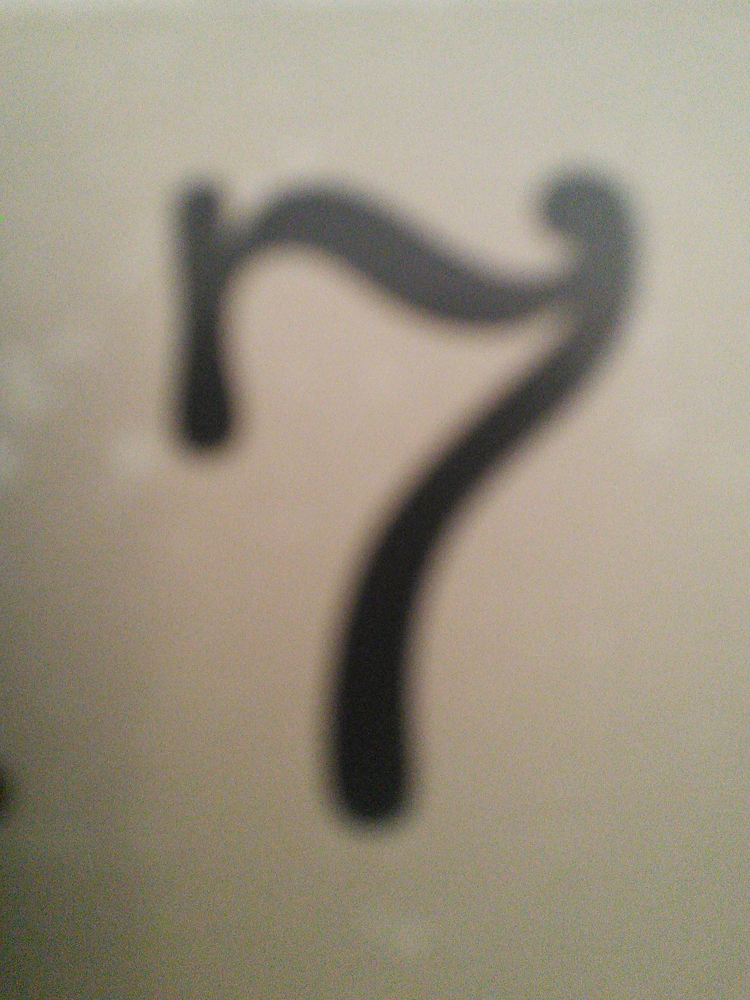

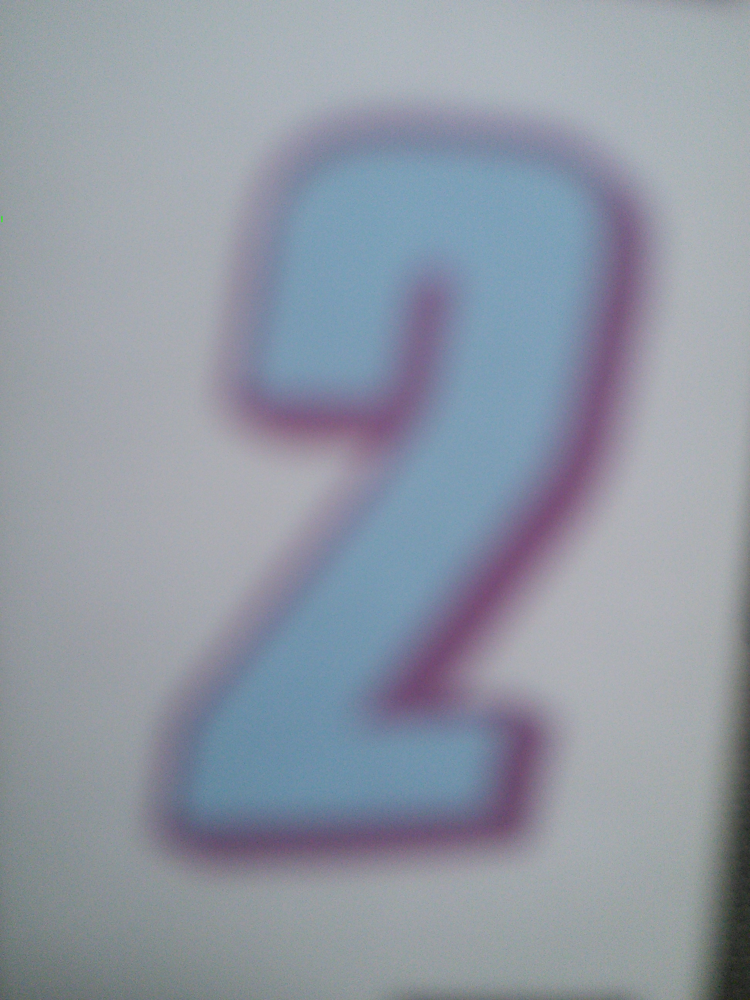

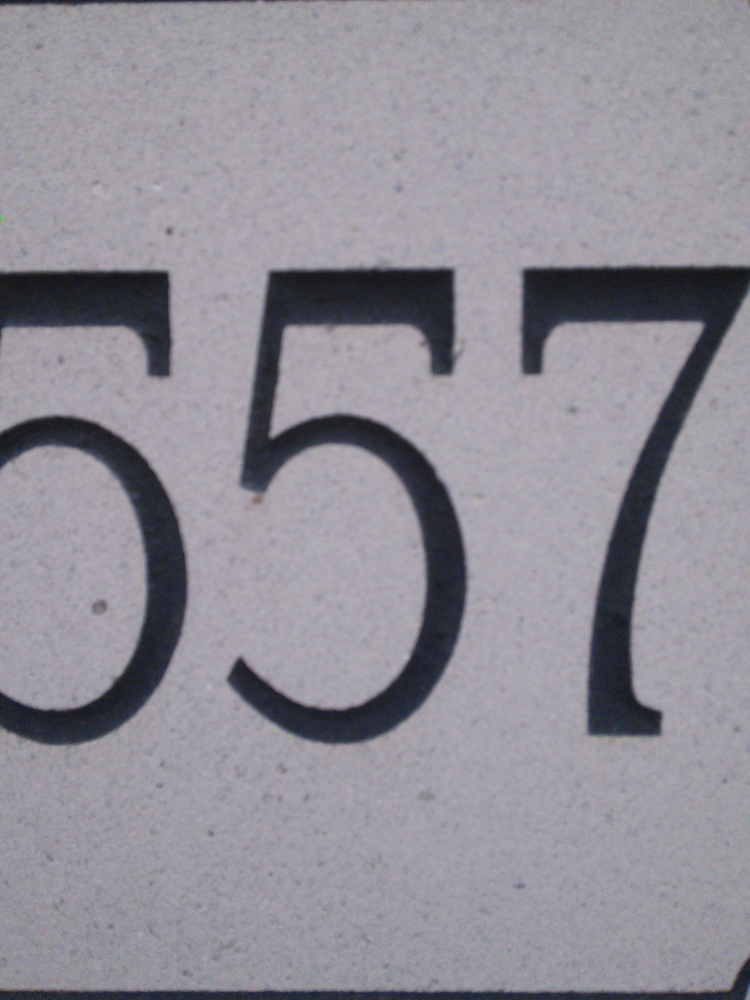

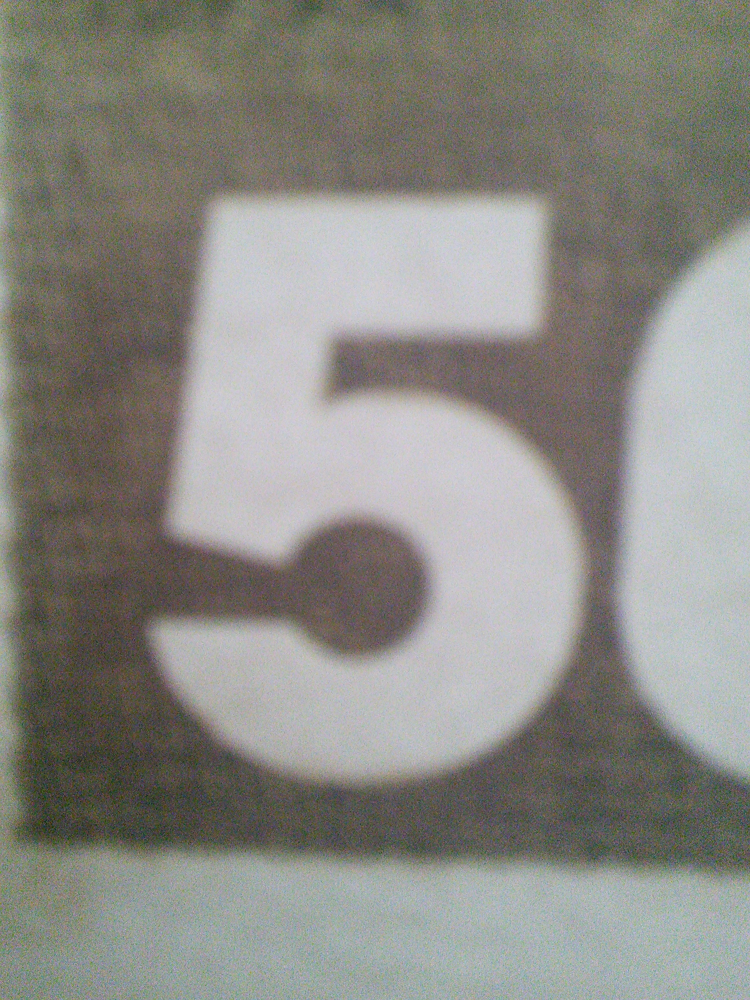

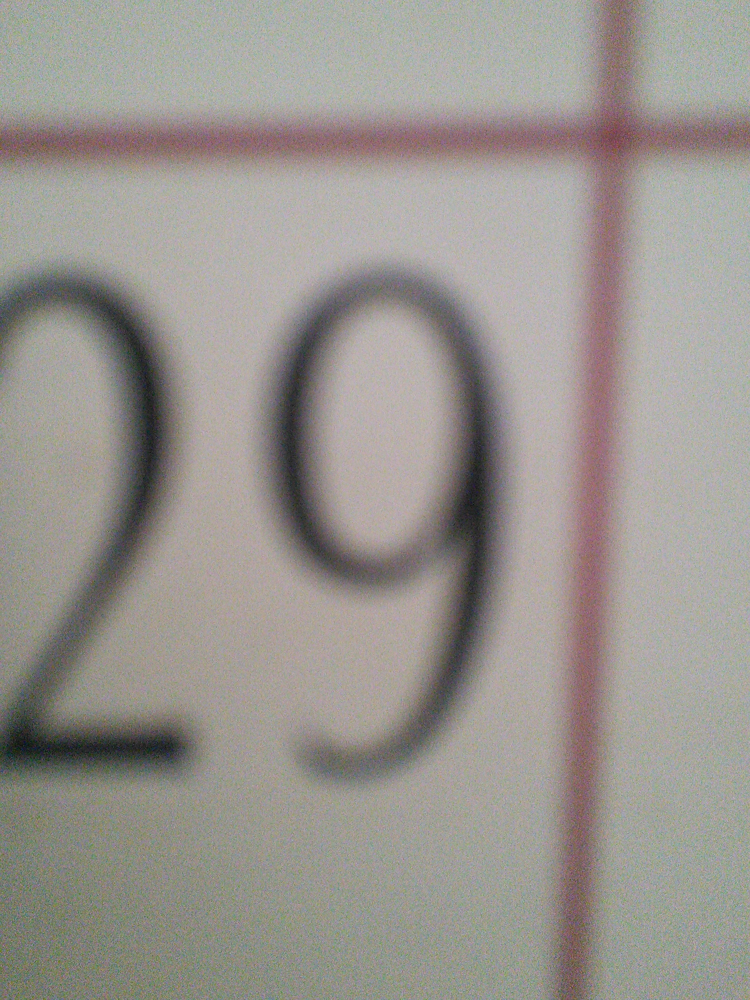

In [3]:
from IPython.display import Image as iImage, display

picfolder_path = "./Pics"
pic_paths = os.listdir(picfolder_path)
for i in range(5):
    # display pics
    display(iImage(os.path.join(picfolder_path, pic_paths[i]), width=100, height=100))
    
labels = np.array([7,2,5,5,9])

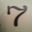

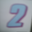

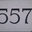

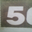

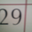

In [23]:
from PIL import Image

resized = []
# resize pics
for i in range(5):
    img = Image.open(os.path.join(picfolder_path, pic_paths[i]))
    resized.extend([img.resize((32, 32),Image.ANTIALIAS)])
    display(resized[i])
    resized[i] = np.array(resized[i])

resized = np.array(resized)

In [28]:
image_size = 32
num_channels = 3
depth1 = 16
depth2 = 32
depth3 = 64
depth4 = 128
kp_fc = 0.5
kp_conv = 0.9
depth5 = 256
num_classes = 10
beta=5e-5

batch_size = 20

patch_size = 4
num_labels = 10

graph = tf.Graph()

with graph.as_default():
    # Input
    tf_test_dataset = tf.placeholder(tf.float32, shape=[5,32,32,3])
    
    # Variables
    weight_layer1 = tf.get_variable("ConvW1", shape=[patch_size, patch_size, 
        num_channels, depth1], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer1 = tf.Variable(tf.constant(1.0, shape=[depth1]))
    
    weight_layer2 = tf.get_variable("ConvW2", shape=[patch_size, patch_size, 
        depth1, depth2], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer2 = tf.Variable(tf.constant(1.0, shape=[depth2]))
    
    weight_layer3 = tf.get_variable("ConvW3", shape=[patch_size, patch_size, 
        depth2, depth3], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer3 = tf.Variable(tf.constant(1.0, shape=[depth3]))
    
    weight_layer4 = tf.get_variable("ConvW4", shape=[patch_size, patch_size, 
        depth3, depth4], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer4 = tf.Variable(tf.constant(1.0, shape=[depth4]))
    
    weight_layer5 = tf.get_variable("FcW1", shape=[2 * 2 * depth4, depth5], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer5 = tf.Variable(tf.constant(1.0, shape=[depth5]))
    
    weight_layer6 = tf.get_variable("FcW2", shape=[depth5, num_classes], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer6 = tf.Variable(tf.constant(1.0, shape=[num_classes]))
    
    # Model
    def model(data, dropout=False):
        # Convolution 1
        conv_1 = tf.nn.conv2d(data, weight_layer1, [1,1,1,1], padding='SAME')
        hidden_1 = tf.nn.relu(conv_1 + bias_layer1)
        pool_1 = tf.nn.max_pool(hidden_1, [1,2,2,1], [1,2,2,1], padding='SAME')
        
        if dropout:
            pool_1 = tf.nn.dropout(pool_1, keep_prob=kp_conv)
        
        # Convolution 2
        conv_2 = tf.nn.conv2d(pool_1, weight_layer2, [1,1,1,1], padding='SAME')
        hidden_2 = tf.nn.relu(conv_2 + bias_layer2)
        pool_2 = tf.nn.max_pool(hidden_2, [1,2,2,1], [1,2,2,1], padding='SAME')
        
        if dropout:
            pool_2 = tf.nn.dropout(pool_2, keep_prob=kp_conv)
        
        # Convolution 3
        conv_3 = tf.nn.conv2d(pool_2, weight_layer3, [1,1,1,1], padding='SAME')
        hidden_3 = tf.nn.relu(conv_3 + bias_layer3)
        pool_3 = tf.nn.max_pool(hidden_3, [1,2,2,1], [1,2,2,1], padding='SAME')
        
        if dropout:
            pool_3 = tf.nn.dropout(pool_3, keep_prob=kp_conv)
            
        # Convolution 4
        conv_4 = tf.nn.conv2d(pool_3, weight_layer4, [1,1,1,1], padding='SAME')
        hidden_4 = tf.nn.relu(conv_4 + bias_layer4)
        pool_4 = tf.nn.max_pool(hidden_4, [1,2,2,1], [1,2,2,1], padding='SAME')
        
        # Reshape
        shape = pool_4.get_shape().as_list()
        reshape = tf.reshape(pool_4, [-1, shape[2] * shape[3] * shape[1]])
        
        if dropout:
            reshape = tf.nn.dropout(reshape, keep_prob=kp_fc)
        
        # Fully Connected
        fc = tf.nn.relu(tf.matmul(reshape, weight_layer5) + bias_layer5)
        
        # Output Classes
        return tf.matmul(fc, weight_layer6) + bias_layer6
        
    # Predictions
    logits = model(tf_test_dataset)
    test_prediction = tf.nn.softmax(logits)
    
    saver = tf.train.Saver()


with tf.Session(graph=graph) as session:
    saver.restore(session, "./tensorflowcheckpoints/svhn")
    test_prediction = session.run(test_prediction, feed_dict={tf_test_dataset : resized})
    
    print(np.argmax(test_prediction, axis=1))

[7 2 5 5 9]


### Question 7
_Choose five candidate images of numbers you took from around you and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult?_

**Answer:**

Some of the digits are non-standard shapes of various thickness. The image of the 2 is in blue, and the 7 has large curves. However, these challenges did not affect the classifier, and it scored perfectly on all of the digits. 

### Question 8
_Is your model able to perform equally well on captured pictures or a live camera stream when compared to testing on the realistic dataset?_

**Answer:**

Yes it did. I arranged the pictures to be centered on the digits, just like the SVHN dataset, hence it did not prove challenging for the classifier.

### Optional: Question 9
_If necessary, provide documentation for how an interface was built for your model to load and classify newly-acquired images._

**Answer:** Leave blank if you did not complete this part.

----
### Step 4: Explore an Improvement for a Model

There are many things you can do once you have the basic classifier in place. One example would be to also localize where the numbers are on the image. The SVHN dataset provides bounding boxes that you can tune to train a localizer. Train a regression loss to the coordinates of the bounding box, and then test it. 

### Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [25]:
import os
import sys
from six.moves.urllib.request import urlretrieve
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import idx2numpy
import time
from scipy.io import loadmat

In [26]:
import pandas as pd

traincsv = './uncropped_data/train/bbtrain.csv'
testcsv = './uncropped_data/test/bbtest.csv'

df_single_train = pd.read_csv(traincsv)
df_single_test = pd.read_csv(testcsv)

In [27]:
df_single_train.iloc[73254:]

,FileName,DigitLabel,Left,Top,Width,Height
73254,33402.png,1,35,10,7,25
73255,33402.png,6,44,8,15,25
73256,33402.png,9,62,9,17,25


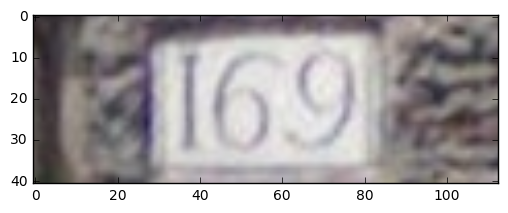

In [28]:
example_image = './uncropped_data/train/33402.png'

from PIL import Image
img = Image.open(example_image)
imgplot = plt.imshow(img)
plt.show()

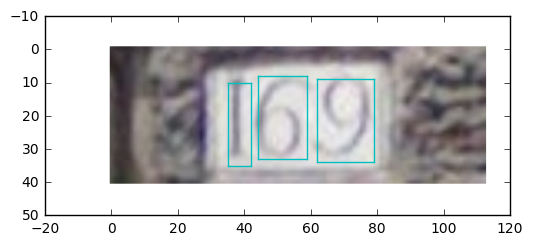

In [29]:
for i in range(3):
    left = df_single_train.iloc[73254 + i]['Left']
    top = df_single_train.iloc[73254 + i]['Top']
    width = df_single_train.iloc[73254 + i]['Width']
    height = df_single_train.iloc[73254 + i]['Height']
    plt.imshow(Image.open(example_image))
    plt.plot([left, left], [top, top + height], 'c')
    plt.plot([left, left+width], [top, top], 'c')
    plt.plot([left+width, left+width], [top, top+height], 'c')
    plt.plot([left, left+width], [top+height, top+height], 'c')

plt.show()

In [30]:
lefts_train = df_single_train.groupby('FileName')['Left'].min()
tops_train = df_single_train.groupby('FileName')['Top'].min()
heights_train = df_single_train.groupby('FileName')['Height'].max()

first_left_train = df_single_train.groupby('FileName').min()['Left']
last_left_train = df_single_train.groupby('FileName').max()['Left']
last_width_train = df_single_train.groupby('FileName').last()['Width']
widths_train = last_left_train + last_width_train - first_left_train 

lefts_test = df_single_test.groupby('FileName')['Left'].min()
tops_test = df_single_test.groupby('FileName')['Top'].min()
heights_test = df_single_test.groupby('FileName')['Height'].max()

first_left_test = df_single_test.groupby('FileName').min()['Left']
last_left_test = df_single_test.groupby('FileName').max()['Left']
last_width_test = df_single_test.groupby('FileName').last()['Width']
widths_test = last_left_test + last_width_test - first_left_test 

## Next Steps

Now that we have a series for each of the left, top, width, and height of the bounding box for each image, we want to arrange them into a DataFrame to prepare for cropping

In [31]:
df_crop_train = lefts_train.to_frame().join(tops_train.to_frame()).join(widths_train.to_frame()).join(heights_train.to_frame())
df_crop_test = lefts_test.to_frame().join(tops_test.to_frame()).join(widths_test.to_frame()).join(heights_test.to_frame())

In [32]:
df_crop_train.columns = ['Left','Top','Width','Height']
df_crop_test.columns = ['Left','Top','Width','Height']
df_crop_train.head()

,Left,Top,Width,Height
FileName,,,,
1.png,246,77,173,219
10.png,25,4,23,27
100.png,18,0,24,22
1000.png,17,1,10,18
10000.png,45,20,43,29


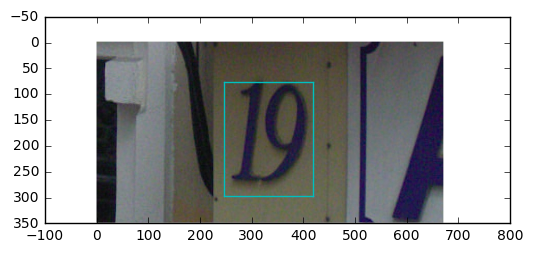

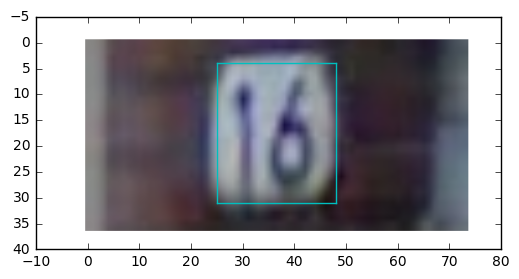

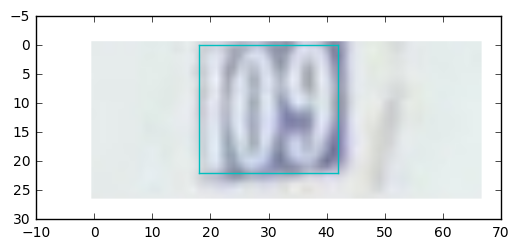

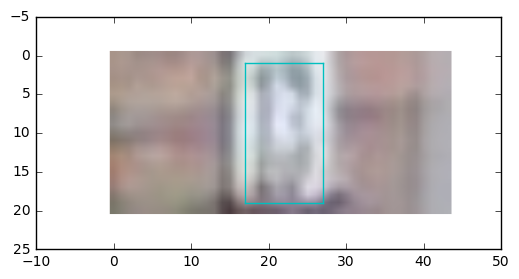

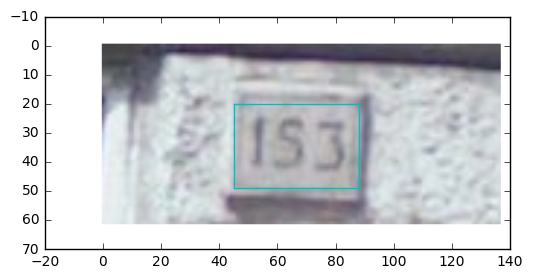

In [33]:
head_images = [1,10,100,1000,10000]

for i in head_images:
    image_name = '{}.png'.format(i)
    example_image = './uncropped_data/train/' + image_name
    img = Image.open(example_image)
    imgplot = plt.imshow(img)
    
    left = df_crop_train.loc[image_name]['Left']    
    top = df_crop_train.loc[image_name]['Top']    
    width = df_crop_train.loc[image_name]['Width']    
    height = df_crop_train.loc[image_name]['Height']
    
    plt.plot([left, left], [top, top + height], 'c')
    plt.plot([left, left+width], [top, top], 'c')
    plt.plot([left+width, left+width], [top, top+height], 'c')
    plt.plot([left, left+width], [top+height, top+height], 'c')
    
    plt.show()

Before cropping, it is suggested that we expand the bounding boxes by 30% in each direction. This will involve subtracting 30% of the width from the left column, subtracting 30% of the height from the top, etc. We must also ensure that this expansion does not go past the edge of the image, so we need to get the true height and width for each image.

In [34]:
df_crop_train['ImageX'] = np.nan
df_crop_train['ImageY'] = np.nan

df_crop_test['ImageX'] = np.nan
df_crop_test['ImageY'] = np.nan

In [35]:
def set_image_dims(df_crop, test=False):
    max_num = df_crop.shape[0]
    for i in range(1, max_num+1):
        folder = str()
        if test:
            folder = './uncropped_data/test/'
        else:
            folder = './uncropped_data/train/'
        
        image_name = '{}.png'.format(i)
        example_image = folder + image_name
        
        img = Image.open(example_image)
        width, height = img.size
        df_crop.set_value(image_name, ['ImageX'], width)
        df_crop = df_crop.set_value(image_name, ['ImageY'], height)

In [36]:
set_image_dims(df_crop_train, test=False)
set_image_dims(df_crop_test, test=True)

In [37]:
df_crop_train.head()
df_crop_test.head()

print(df_crop_train.isnull().values.any())
print(df_crop_test.isnull().values.any())

False
False


Now that we have the image dimensions, we can apply a function to the columns of the DataFrame that expands the bounding boxes. 

In [38]:
def fixLeft(row):
    return max( row['Left'] - 0.3 * row['Width'] , 0 )

df_crop_train['cropLeft'] = df_crop_train.apply(fixLeft, axis=1)
df_crop_test['cropLeft'] = df_crop_test.apply(fixLeft, axis=1)

def fixTop(row):
    return max( row['Top'] - 0.3 * row['Height'] , 0 )

df_crop_train['cropTop'] = df_crop_train.apply(fixTop, axis=1)
df_crop_test['cropTop'] = df_crop_test.apply(fixTop, axis=1)

In [39]:
def fixWidth(row):
    return( min( 1.6 * row['Width'], row['ImageX'] - row['cropLeft']))

df_crop_train['cropWidth'] = df_crop_train.apply(fixWidth, axis=1)
df_crop_test['cropWidth'] = df_crop_test.apply(fixWidth, axis=1)

def fixHeight(row):
    if row['Top'] + 1.6 * row['Height'] > row['ImageY']:
        return row['ImageY'] - row['cropTop']
    else:
        return 1.6 * row['Height']

df_crop_train['cropHeight'] = df_crop_train.apply(fixHeight, axis=1)
df_crop_test['cropHeight'] = df_crop_test.apply(fixHeight, axis=1)

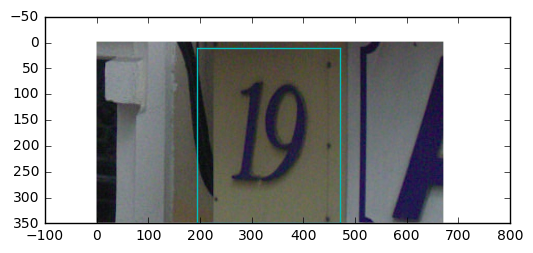

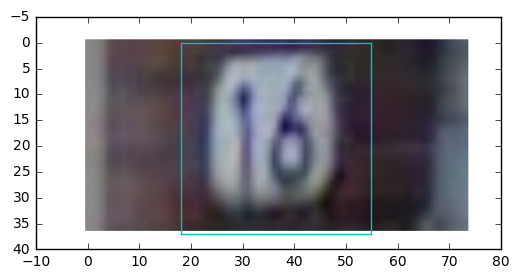

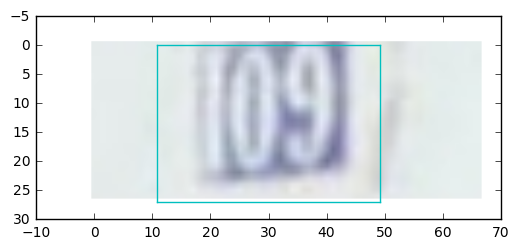

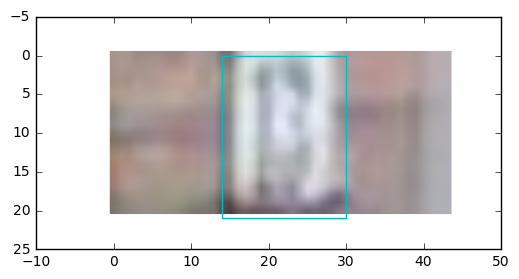

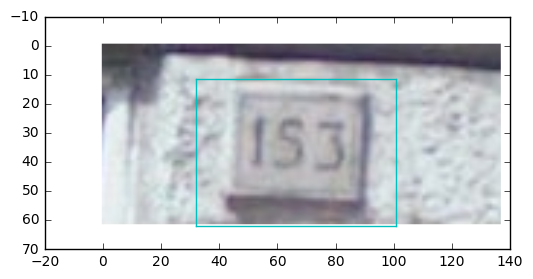

In [40]:
for i in head_images:
    image_name = '{}.png'.format(i)
    example_image = './uncropped_data/train/' + image_name
    img = Image.open(example_image)
    imgplot = plt.imshow(img)
    
    left = df_crop_train.loc[image_name]['cropLeft']    
    top = df_crop_train.loc[image_name]['cropTop']    
    width = df_crop_train.loc[image_name]['cropWidth']    
    height = df_crop_train.loc[image_name]['cropHeight']
    
    
    plt.plot([left, left], [top, top + height], 'c')
    plt.plot([left, left+width], [top, top], 'c')
    plt.plot([left+width, left+width], [top, top+height], 'c')
    plt.plot([left, left+width], [top+height, top+height], 'c')
    
    plt.show()

In [41]:
df_crop_train.head()

,Left,Top,Width,Height,ImageX,ImageY,cropLeft,cropTop,cropWidth,cropHeight
FileName,,,,,,,,,,
1.png,246,77,173,219,741.0,350.0,194.1,11.3,276.8,338.7
10.png,25,4,23,27,74.0,37.0,18.1,0.0,36.8,37.0
100.png,18,0,24,22,67.0,27.0,10.8,0.0,38.4,27.0
1000.png,17,1,10,18,44.0,21.0,14.0,0.0,16.0,21.0
10000.png,45,20,43,29,137.0,62.0,32.1,11.3,68.8,50.7


In [42]:
df_crop_train = df_crop_train.drop(['Left','Top','Width','Height'], axis=1)
df_crop_test = df_crop_test.drop(['Left','Top','Width','Height'], axis=1)

Now it is time to crop and resize all of the images, while preserving the location of the bounding boxes. We have four DataFrames:
```
df_single_train
df_single_test
df_crop_train
df_crop_test
```
Once we crop the images, the original two DataFrames' information becomes incorrect. So from the Top and Left columns, we need to subtract the values of the cropTop and cropLeft. But first let's crop:

In [21]:
def crop_images(df_crop, test=False):
    max_num = df_crop.shape[0]
    for i in range(1, max_num + 1):
        image_name = '{}.png'.format(i)
        folder = './uncropped_data/'
        if test:
            folder = folder + 'test/'
        else:
            folder = folder + 'train/'
        example_image = folder + image_name
        img = Image.open(example_image)
        
        # locate the top, left, width, and height of the crop
        left = df_crop.loc[image_name]['cropLeft']    
        top = df_crop.loc[image_name]['cropTop']    
        width = df_crop.loc[image_name]['cropWidth']    
        height = df_crop.loc[image_name]['cropHeight']
        
        # create a new image during a crop, and save to the folder
        newfolder = './uncropped_data/'
        if test:
            newfolder = newfolder + 'cropTest/'
        else:
            newfolder = newfolder + 'cropTrain/'
        
        new_image_loc = newfolder + image_name
        
        img2 = img.crop(( left, top, width+left, height+top ))
        img2 = img2.resize((64,64))
        img2.save(new_image_loc)
        

#crop_images(df_crop_train, test=False)
#crop_images(df_crop_test, test=True)

In [43]:
def display_image(image_name, crop=False, test=False):
    folder = './uncropped_data/'
    
    if crop and test:
        folder = folder + 'cropTest/'
    elif crop and not test:
        folder = folder + 'cropTrain/'
    elif not crop and test:
        folder = folder + 'test/'
    else:
        folder = folder + 'train/'
    
    example_image = folder + image_name
    img = Image.open(example_image)
    plt.imshow(img)
    plt.show()

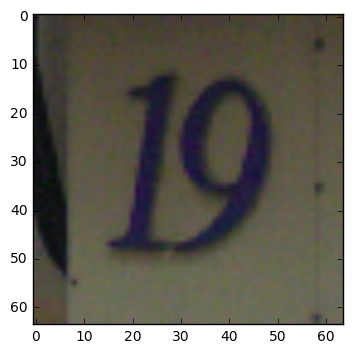

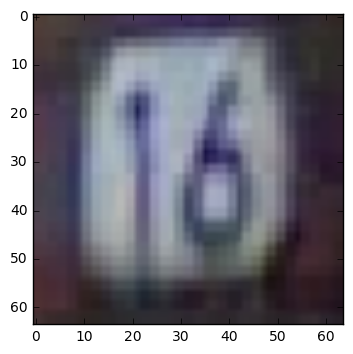

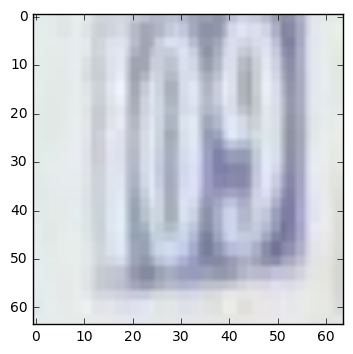

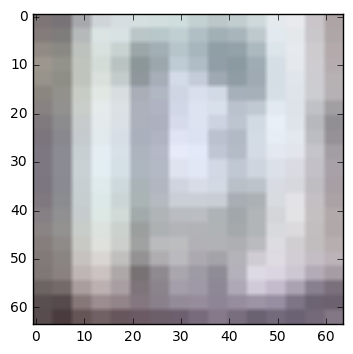

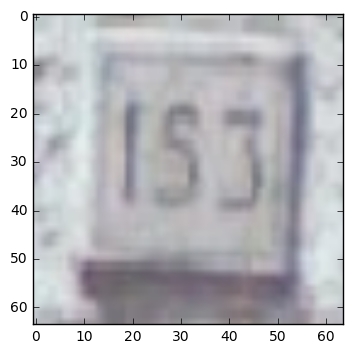

In [44]:
for image in head_images:
    image = str(image)
    display_image(image+'.png', crop=True)

The cropping is finished! Now we need to get the values of the bounding boxes. This will be easiest if we just add the values for the transformed boxes to the original DataFrames

In [45]:
test_df_single = df_single_train.iloc[:20]
test_df_crop = df_crop_train.loc[['1.png','2.png','3.png','4.png','5.png','6.png','7.png','8.png','9.png']]
print(test_df_single)
test_df_crop

   FileName  DigitLabel  Left  Top  Width  Height
0     1.png           1   246   77     81     219
1     1.png           9   323   81     96     219
2     2.png           2    77   29     23      32
3     2.png           3    98   25     26      32
4     3.png           2    17    5      8      15
5     3.png           5    25    5      9      15
6     4.png           9    57   13     15      34
7     4.png           3    72   13     13      34
8     5.png           3    52    7     21      46
9     5.png           1    74   10     15      46
10    6.png           3    28    6     10      21
11    6.png           3    38    8     11      21
12    7.png           2    35   10     13      32
13    7.png           8    47   11     13      32
14    8.png           7    17    4      7      15
15    8.png           4    25    4      6      15
16    8.png           4    31    3      7      15
17    9.png           1    19    4     14      24
18    9.png           2    29    4     13      24


,ImageX,ImageY,cropLeft,cropTop,cropWidth,cropHeight
FileName,,,,,,
1.png,741.0,350.0,194.1,11.3,276.8,338.7
2.png,199.0,83.0,62.9,15.4,75.2,51.2
3.png,52.0,23.0,11.9,0.5,27.2,22.5
4.png,161.0,79.0,48.6,2.8,44.8,54.4
5.png,140.0,68.0,40.9,0.0,59.2,68.0
6.png,74.0,35.0,21.7,0.0,33.6,35.0
7.png,99.0,54.0,27.5,0.4,40.0,53.6
8.png,54.0,22.0,10.7,0.0,33.6,22.0
9.png,79.0,34.0,8.2,0.0,57.6,34.0


In [46]:
# These functions calculate the new locations for the bounding boxes
# based on a crop a translation to this image size:

image_size = 64.0

def get_new_top(oldTop, cropTop, cropHeight):
    newTop = oldTop - cropTop
    newTop *= image_size/cropHeight
    return newTop

def get_new_left(oldLeft, cropLeft, cropWidth):
    newLeft = oldLeft - cropLeft
    newLeft *= image_size/cropWidth
    return newLeft

def get_new_width(oldWidth, cropWidth):
    newWidth = image_size*oldWidth/cropWidth
    return newWidth

def get_new_height(oldHeight, cropHeight):
    newHeight = image_size*oldHeight/cropHeight
    return newHeight

In [47]:
def cropped_bbs(df_single, df_crop):
    max_num = df_crop.shape[0]
    
    # add 20 new columns to our crop DataFrame
    df_crop['d1_bb_top'] = np.nan
    df_crop['d1_bb_left'] = np.nan
    df_crop['d1_bb_width'] = np.nan
    df_crop['d1_bb_height'] = np.nan
    
    df_crop['d2_bb_top'] = np.nan
    df_crop['d2_bb_left'] = np.nan
    df_crop['d2_bb_width'] = np.nan
    df_crop['d2_bb_height'] = np.nan
    
    df_crop['d3_bb_top'] = np.nan
    df_crop['d3_bb_left'] = np.nan
    df_crop['d3_bb_width'] = np.nan
    df_crop['d3_bb_height'] = np.nan
    
    df_crop['d4_bb_top'] = np.nan
    df_crop['d4_bb_left'] = np.nan
    df_crop['d4_bb_width'] = np.nan
    df_crop['d4_bb_height'] = np.nan
    
    df_crop['d5_bb_top'] = np.nan
    df_crop['d5_bb_left'] = np.nan
    df_crop['d5_bb_width'] = np.nan
    df_crop['d5_bb_height'] = np.nan
    
    for i in range(1, max_num+1):
        image = str(i) + '.png'
        
        cropTop = df_crop.loc[image]['cropTop']
        cropLeft = df_crop.loc[image]['cropLeft']
        cropHeight = df_crop.loc[image]['cropHeight']
        cropWidth = df_crop.loc[image]['cropWidth']
        
        df_slice = df_single[df_single['FileName'] == image]
        num_digits = df_slice.shape[0]
        
        for digit_place in range(1,6):
            d_holder = 'd' + str(digit_place) + '_bb_'
            
            if digit_place <= num_digits:
                
                oldTop = df_slice.iloc[digit_place-1]['Top']
                oldLeft = df_slice.iloc[digit_place-1]['Left']
                oldWidth = df_slice.iloc[digit_place-1]['Width']
                oldHeight = df_slice.iloc[digit_place-1]['Height']
                
                newTop = get_new_top(oldTop, cropTop, cropHeight)
                newLeft = get_new_left(oldLeft, cropLeft, cropWidth)
                newWidth = get_new_width(oldWidth, cropWidth)
                newHeight = get_new_height(oldHeight, cropHeight)
                
                df_crop.set_value(image, [d_holder+'top'], newTop)
                df_crop.set_value(image, [d_holder+'left'], newLeft)
                df_crop.set_value(image, [d_holder+'width'], newWidth)
                df_crop.set_value(image, [d_holder+'height'], newHeight)
            
            else:
                # For blank digits, we will put the bounding box 
                # outside the range of the image
                df_crop.set_value(image, [d_holder+'top'], 0)
                df_crop.set_value(image, [d_holder+'left'], 65)
                df_crop.set_value(image, [d_holder+'width'], 10)
                df_crop.set_value(image, [d_holder+'height'], 10)

In [48]:
cropped_bbs(df_single_train, df_crop_train)
cropped_bbs(df_single_test, df_crop_test)

In [49]:
df_crop_train.head()

,ImageX,ImageY,cropLeft,cropTop,cropWidth,cropHeight,d1_bb_top,d1_bb_left,d1_bb_width,d1_bb_height,...,d3_bb_width,d3_bb_height,d4_bb_top,d4_bb_left,d4_bb_width,d4_bb_height,d5_bb_top,d5_bb_left,d5_bb_width,d5_bb_height
FileName,,,,,,,,,,,,,,,,,,,,,
1.png,741.0,350.0,194.1,11.3,276.8,338.7,12.414526,12.0,18.728324,41.381754,...,10.000000,10.000000,0.0,65.0,10.0,10.0,0.0,65.0,10.0,10.0
10.png,74.0,37.0,18.1,0.0,36.8,37.0,10.378378,12.0,15.652174,46.702703,...,10.000000,10.000000,0.0,65.0,10.0,10.0,0.0,65.0,10.0,10.0
100.png,67.0,27.0,10.8,0.0,38.4,27.0,2.370370,12.0,8.333333,52.148148,...,16.666667,52.148148,0.0,65.0,10.0,10.0,0.0,65.0,10.0,10.0
1000.png,44.0,21.0,14.0,0.0,16.0,21.0,3.047619,12.0,16.000000,54.857143,...,10.000000,10.000000,0.0,65.0,10.0,10.0,0.0,65.0,10.0,10.0
10000.png,137.0,62.0,32.1,11.3,68.8,50.7,10.982249,12.0,13.953488,36.607495,...,16.744186,36.607495,0.0,65.0,10.0,10.0,0.0,65.0,10.0,10.0


In [50]:
def plot_crop_bbs(image_name, test=False):
    folder = './uncropped_data/'
    if test:
        folder += 'cropTest/'
    else:
        folder += 'cropTrain/'
    example_image = folder + image_name
    img = Image.open(example_image)
    plt.imshow(img)
    
    for digit_place in range(1,6):
        d_holder = 'd' + str(digit_place) + '_bb_'
        
        left = df_crop_train.loc[image_name][d_holder+'left']    
        top = df_crop_train.loc[image_name][d_holder+'top']    
        width = df_crop_train.loc[image_name][d_holder+'width']    
        height = df_crop_train.loc[image_name][d_holder+'height']
        
        plt.plot([left, left], [top, top + height], 'c')
        plt.plot([left, left+width], [top, top], 'c')
        plt.plot([left+width, left+width], [top, top+height], 'c')
        plt.plot([left, left+width], [top+height, top+height], 'c')
    
    plt.show()

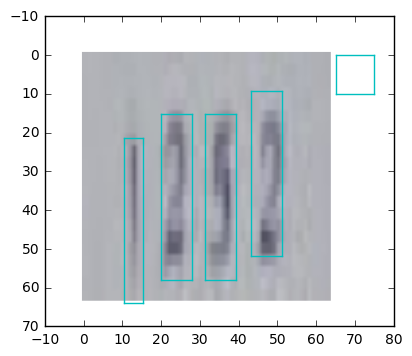

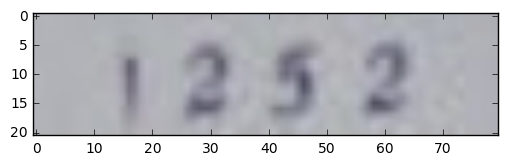

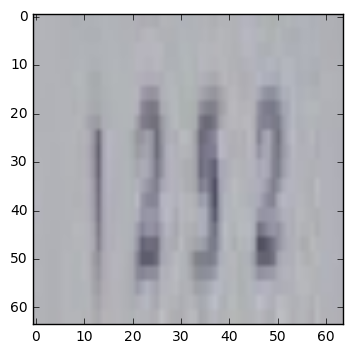

In [51]:
plot_crop_bbs('20000.png')
display_image('20000.png')
display_image('20000.png', crop=True)

We need to be able to plot the bounding boxes on the cropped images. Let's modify `df_crop_bb_train` to hold the bounding boxes for each image.

In [52]:
newcols = ['d1_bb_top', 'd1_bb_left', 'd1_bb_width', 'd1_bb_height',
          'd2_bb_top', 'd2_bb_left', 'd2_bb_width', 'd2_bb_height',
          'd3_bb_top', 'd3_bb_left', 'd3_bb_width', 'd3_bb_height',
          'd4_bb_top', 'd4_bb_left', 'd4_bb_width', 'd4_bb_height',
          'd5_bb_top', 'd5_bb_left', 'd5_bb_width', 'd5_bb_height']

for col in newcols:
    if df_crop_train[col].isnull().values.any():
        print('train',col)
    if df_crop_test[col].isnull().values.any():
        print('test',col)

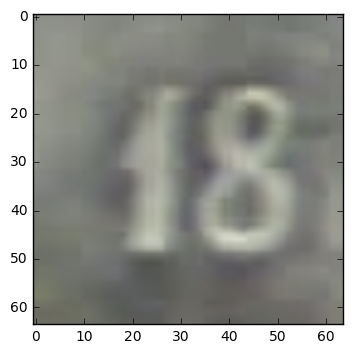

In [53]:
display_image('10036.png', test=True, crop=True)

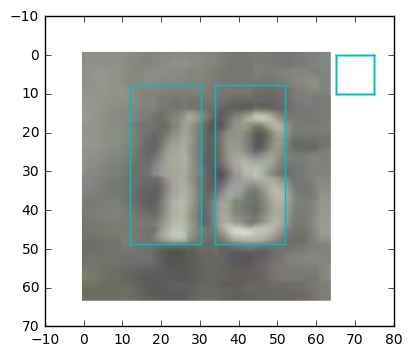

In [54]:
plot_crop_bbs('10036.png',test=True)

In [55]:
def get_bb_array(image_name, test=False):
    folder = './uncropped_data/'
    if test:
        folder += 'cropTest/'
    else:
        folder += 'cropTrain/'
    example_image = folder + image_name
    img = Image.open(example_image)
    
    bbs = []
    
    for digit_place in range(1,6):
        d_holder = 'd' + str(digit_place) + '_bb_'
        
        left = df_crop_train.loc[image_name][d_holder+'left']   
        top = df_crop_train.loc[image_name][d_holder+'top']    
        width = df_crop_train.loc[image_name][d_holder+'width']    
        height = df_crop_train.loc[image_name][d_holder+'height']
        
        bbs.append(left)
        bbs.append(top)
        bbs.append(width)
        bbs.append(height)
    
    img.close()
    return np.array(bbs).reshape((-1,4))

In [56]:
get_bb_array('10036.png',test=True)

array([[ 12.        ,   7.68      ,  18.18181818,  40.96      ],
       [ 33.81818182,   7.68      ,  18.18181818,  40.96      ],
       [ 65.        ,   0.        ,  10.        ,  10.        ],
       [ 65.        ,   0.        ,  10.        ,  10.        ],
       [ 65.        ,   0.        ,  10.        ,  10.        ]])

If seems the pipeline for processing images is complete. Next we need a metric. One way to evaluate the bounding boxes is by using the Intersect of Union. It is calculated as the area of the overlapping regions of the predicted and actual bounding boxes divided by the combined area. 

In [57]:
def batch_iou(a, b, epsilon=1e-5):
    """ 
    a and b are batches of bounding boxes, [left, top, width, height]
    
    I slightly modified the code from this tutorial:
    http://ronny.rest/tutorials/lesson/intersect_of_union/
    """
    
    a_rights = a[:, 0] + a[:, 2]
    a_bottoms = a[:, 1] + a[:, 3]
    
    b_rights = b[:, 0] + b[:, 2]
    b_bottoms = b[:, 1] + b[:, 3]
    
    # COORDINATES OF THE INTERSECTION BOXES
    x1 = np.array([a[:, 0], b[:, 0]]).max(axis=0)
    y1 = np.array([a[:, 1], b[:, 1]]).max(axis=0)
    x2 = np.array([a_rights, b_rights]).min(axis=0)
    y2 = np.array([a_bottoms, b_bottoms]).min(axis=0)

    # AREAS OF OVERLAP - Area where the boxes intersect
    width = (x2 - x1)
    height = (y2 - y1)

    # handle case where there is NO overlap
    width[width < 0] = 0
    height[height < 0] = 0

    area_overlap = width * height

    # COMBINED AREAS
    area_a = (a_rights - a[:, 0]) * (a_bottoms - a[:, 1])
    area_b = (b_rights - b[:, 0]) * (b_bottoms - b[:, 1])
    area_combined = area_a + area_b - area_overlap

    # RATIO OF AREA OF OVERLAP OVER COMBINED AREA
    iou = area_overlap / (area_combined + epsilon)
    return iou

In [58]:
batch_a = get_bb_array('10036.png', test=True)
pred_batch_a = np.array([1+i for i in batch_a])

In [59]:
batch_iou(batch_a, pred_batch_a)

array([ 0.79556984,  0.79556984,  0.57857139,  0.57857139,  0.57857139])

In [60]:
def metric(true_boxes, pred_boxes):
    ious = batch_iou(np.reshape(true_boxes, (-1, 4)), 
                     np.reshape(pred_boxes, (-1, 4)))
    return np.mean(ious)

In [89]:
image_size = 64
num_channels = 3

def make_datasets(valid_size = 5000):
    folder = './uncropped_data/'
    train_folder = folder + 'cropTrain/'
    test_folder = folder + 'cropTest/'
    
    train_size = len(os.listdir(train_folder)) - valid_size
    test_size = len(os.listdir(test_folder))
    
    train_dataset = np.ndarray(shape=(train_size, image_size, image_size, num_channels), dtype=np.float32)
    valid_dataset = np.ndarray(shape=(valid_size, image_size, image_size, num_channels), dtype=np.float32)
    test_dataset = np.ndarray(shape=(test_size, image_size, image_size, num_channels), dtype=np.float32)
        
    for i in range(1,train_size+1):
        image = str(i) + '.png'
        img = Image.open( train_folder + image )
        data = np.asarray( img, dtype=np.float32 )
        img.close()
        train_dataset[i-1,:,:,:] = (data - 128.0) / 128.0
        
    for i in range(1,valid_size+1):
        image = str(i+train_size) + '.png'
        img = Image.open( train_folder + image)
        data = np.asarray( img, dtype=np.float32)
        img.close()
        valid_dataset[i-1,:,:,:] = (data - 128.0) / 128.0
    
    for i in range(1,test_size+1):
        image = str(i) + '.png'
        img = Image.open( test_folder + image)
        data = np.asarray( img, dtype=np.float32)
        img.close()
        test_dataset[i-1,:,:,:] = (data - 128.0) / 128.0
        
    
    return train_dataset, valid_dataset, test_dataset

train_dataset, valid_dataset, test_dataset = make_datasets()

In [90]:
print(train_dataset.shape)
print(valid_dataset.shape)
print(test_dataset.shape)

(28402, 64, 64, 3)
(5000, 64, 64, 3)
(13068, 64, 64, 3)


In [91]:
def make_labels(valid_size=5000):
    folder = './uncropped_data/'
    train_folder = folder + 'cropTrain/'
    test_folder = folder + 'cropTest/'
    
    train_size = len(os.listdir(train_folder)) - valid_size
    test_size = len(os.listdir(test_folder))
    
    train_labels = np.ndarray(shape=(train_size, 20))
    valid_labels = np.ndarray(shape=(valid_size, 20))
    test_labels = np.ndarray(shape=(test_size, 20))
    
    for i in range(1,train_size+1):
        image = str(i) + '.png'
        train_labels[i-1,:] = np.reshape(get_bb_array(image, 
                                    test=False),newshape=(20))/64.0
        
    for i in range(1, valid_size+1):
        image = str(i+train_size) + '.png'
        valid_labels[i-1,:] = np.reshape(get_bb_array(image,
                                    test=False),newshape=(20))/64.0
    
    for i in range(1,test_size+1):
        image= str(i) + '.png'
        test_labels[i-1,:] = np.reshape(get_bb_array(image,
                                    test=True),newshape=(20))/64.0
        
    return train_labels, valid_labels, test_labels

train_labels, valid_labels, test_labels = make_labels()

In [92]:
print(train_labels.shape)
print(valid_labels.shape)
print(test_labels.shape)

(28402, 20)
(5000, 20)
(13068, 20)


In [93]:
def pickle_it():
    pickle.dump(train_dataset[:20000], open("train_dataset1.pkl", "wb"))
    pickle.dump(train_dataset[20000:], open("train_dataset2.pkl", "wb"))
    pickle.dump(valid_dataset, open("valid_dataset.pkl", "wb"))
    pickle.dump(test_dataset, open("test_dataset.pkl", "wb"))

    pickle.dump(train_labels, open("train_labels.pkl", "wb"))
    pickle.dump(valid_labels, open("valid_labels.pkl", "wb"))
    pickle.dump(test_labels, open("test_labels.pkl", "wb"))

pickle_it()

In [94]:
import pickle

def unpickle_it():
    train_dataset1 = pickle.load(open("train_dataset1.pkl", "rb"))
    #train_dataset2 = pickle.load(open("train_dataset2.pkl", "rb"))
    #train_dataset = np.concatenate([train_dataset1, train_dataset2], axis=0)
    valid_dataset = pickle.load(open("valid_dataset.pkl", "rb"))
    test_dataset = pickle.load(open("test_dataset.pkl", "rb"))
    
    train_labels = pickle.load(open("train_labels.pkl", "rb"))
    valid_labels = pickle.load(open("valid_labels.pkl", "rb"))
    test_labels = pickle.load(open("test_labels.pkl", "rb"))
    
    return train_dataset1, valid_dataset, test_dataset, train_labels, valid_labels, test_labels

train_dataset, valid_dataset, test_dataset, train_labels, valid_labels, test_labels = unpickle_it()

In [95]:
train_dataset = train_dataset.astype(np.float32)
valid_dataset = valid_dataset.astype(np.float32)
test_dataset = test_dataset.astype(np.float32)

train_labels = train_labels.astype(np.float32)
valid_labels = valid_labels.astype(np.float32)
test_labels = test_labels.astype(np.float32)

print(train_dataset.shape, train_dataset.dtype)
print(valid_dataset.shape, valid_dataset.dtype)
print(test_dataset.shape, test_dataset.dtype)

print(train_labels.shape, train_labels.dtype)
print(valid_labels.shape, valid_labels.dtype)
print(test_labels.shape, test_labels.dtype)

(20000, 64, 64, 3) float32
(5000, 64, 64, 3) float32
(13068, 64, 64, 3) float32
(28402, 20) float32
(5000, 20) float32
(13068, 20) float32


In [105]:
# trim test set and labels because of memory error
test_dataset = test_dataset[:5000]
test_labels = test_labels[:5000]

train_labels = train_labels[:20000]

In [115]:
depth1 = 16
depth2 = 32
depth3 = 64
depth4 = 128

num_outputs = 20
beta=5e-5
patch_size = 4
image_size = 64
num_channels = 3

graph = tf.Graph()

with graph.as_default():
    # Input
    tf_train_dataset = tf.placeholder(tf.float32, 
                shape=(None, image_size, image_size, num_channels))
    tf_train_labels = tf.placeholder(tf.float32,
                shape=(None, 20))
    tf_valid_dataset = tf.constant(valid_dataset)
    tf_test_dataset = tf.constant(test_dataset)
    
    # Variables
    weight_layer1 = tf.get_variable("ConvW1", shape=[patch_size, patch_size, 
        num_channels, depth1], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer1 = tf.Variable(tf.constant(1.0, shape=[depth1]))
    
    weight_layer2 = tf.get_variable("ConvW2", shape=[patch_size, patch_size, 
        depth1, depth2], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer2 = tf.Variable(tf.constant(1.0, shape=[depth2]))
    
    weight_layer3 = tf.get_variable("ConvW3", shape=[patch_size, patch_size, 
        depth2, depth3], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer3 = tf.Variable(tf.constant(1.0, shape=[depth3]))
    
    weight_layer4 = tf.get_variable("ConvW4", shape=[patch_size, patch_size, 
        depth3, depth4], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer4 = tf.Variable(tf.constant(1.0, shape=[depth4]))
    
    weight_layer5 = tf.get_variable("FcW1", shape=[4 * 4 * depth4, num_outputs], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer5 = tf.Variable(tf.constant(1.0, shape=[num_outputs]))
    
    # Model
    def model(data, ):
        conv1 = tf.nn.conv2d(data, weight_layer1, [1,2,2,1], padding='SAME')
        hidden1 = tf.nn.relu(conv1 + bias_layer1)
        
        conv2 = tf.nn.conv2d(hidden1, weight_layer2, [1,2,2,1], padding='SAME')
        hidden2 = tf.nn.relu(conv2 + bias_layer2)
        
        conv3 = tf.nn.conv2d(hidden2, weight_layer3, [1,2,2,1], padding='SAME')
        hidden3 = tf.nn.relu(conv3 + bias_layer3)
        
        conv4 = tf.nn.conv2d(hidden3, weight_layer4, [1,2,2,1], padding='SAME')
        hidden4 = tf.nn.relu(conv4 + bias_layer4)
        
        shape = hidden4.get_shape().as_list()
        reshape = tf.reshape(hidden4, [-1, shape[1]*shape[2]*shape[3]])
        
        return tf.nn.relu(tf.matmul(reshape, weight_layer5) + bias_layer5)
    
    # Training computation
    logits = model(tf_train_dataset)
    loss = tf.reduce_mean(tf.squared_difference(logits, tf_train_labels))
    loss += beta*(tf.nn.l2_loss(weight_layer1)+tf.nn.l2_loss(weight_layer2)+tf.nn.l2_loss(weight_layer3)+tf.nn.l2_loss(weight_layer4)+tf.nn.l2_loss(weight_layer5))
    
    # Optimizer
    global_step = tf.Variable(0)
    learning_rate = tf.train.exponential_decay(0.05, global_step, 
            decay_steps=10000, decay_rate=0.96, staircase=True)
    optimizer = tf.train.AdamOptimizer(learning_rate).minimize(loss)
    
    # Predictions for the training, validation, and test data
    train_prediction = logits
    valid_prediction = model(tf_valid_dataset)
    test_prediction = model(tf_test_dataset)
    
    saver = tf.train.Saver()

In [116]:
num_steps = 300001
batch_size = 6

with tf.Session(graph=graph) as session:
    tf.global_variables_initializer().run()
    #saver.restore(session, tf.train.latest_checkpoint('./tensorflowcheckpoints/'))
    print('Initialized')
    
    for step in range(num_steps):
        offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
        batch_data = train_dataset[offset:(offset + batch_size), :, :, :]
        batch_labels = train_labels[offset:(offset + batch_size), :]
        feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
        _, l, predictions = session.run(
          [optimizer, loss, train_prediction], feed_dict=feed_dict)
        if (step % 2500 == 0):
            print('Minibatch loss at step %d: %f' % (step, l))
            print('Minibatch accuracy: %.1f%%' % metric(predictions, batch_labels))
        if (step % 10000 == 0):
            print('Validation accuracy: %.1f%%' % metric(
                valid_prediction.eval(), valid_labels))
    print('Test accuracy: %.1f%%' % metric(test_prediction.eval(), test_labels))
    save_path = saver.save(session, "./tensorflowcheckpoints/bbs4")
    print('Model saved to {}'.format(save_path))

Initialized
Minibatch loss at step 0: 1.719239
Minibatch accuracy: 0.0%
Validation accuracy: 0.0%
Minibatch loss at step 2500: 0.548391
Minibatch accuracy: 0.0%
Minibatch loss at step 5000: 1.719223
Minibatch accuracy: 0.0%
Minibatch loss at step 7500: 16.522694
Minibatch accuracy: 0.0%
Minibatch loss at step 10000: 15.912806
Minibatch accuracy: 0.0%
Validation accuracy: 0.0%
Minibatch loss at step 12500: 15.209406
Minibatch accuracy: 0.0%
Minibatch loss at step 15000: 15.644851
Minibatch accuracy: 0.0%
Minibatch loss at step 17500: 15.188120
Minibatch accuracy: 0.0%
Minibatch loss at step 20000: 14.483620
Minibatch accuracy: 0.0%
Validation accuracy: 0.0%
Minibatch loss at step 22500: 13.665503
Minibatch accuracy: 0.0%
Minibatch loss at step 25000: 12.773808
Minibatch accuracy: 0.0%
Minibatch loss at step 27500: 12.502512
Minibatch accuracy: 0.0%
Minibatch loss at step 30000: 14.814592
Minibatch accuracy: 0.0%
Validation accuracy: 0.0%
Minibatch loss at step 32500: 17.415756
Minibatch

### Question 10
_How well does your model localize numbers on the testing set from the realistic dataset? Do your classification results change at all with localization included?_

**Answer:**

The classifier was trained on the single digits, and the bounding box regressor was trained on the multi-digit set, so I can't test the classification abilities of the model with the bounding boxes. However, since the classifier and regressor work separately, I would assume the bounding boxes do not affect the accuracy. 

### Question 11
_Test the localization function on the images you captured in **Step 3**. Does the model accurately calculate a bounding box for the numbers in the images you found? If you did not use a graphical interface, you may need to investigate the bounding boxes by hand._ Provide an example of the localization created on a captured image.

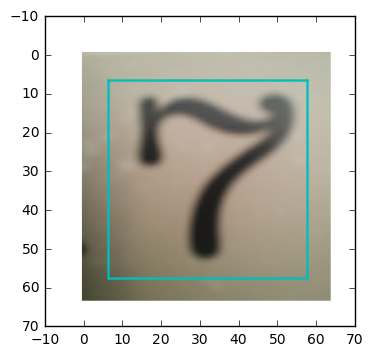

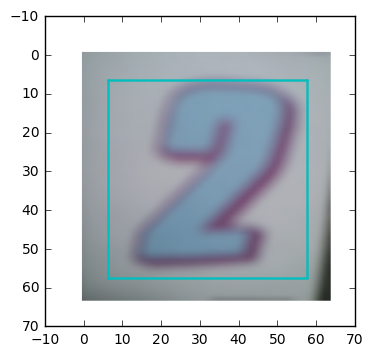

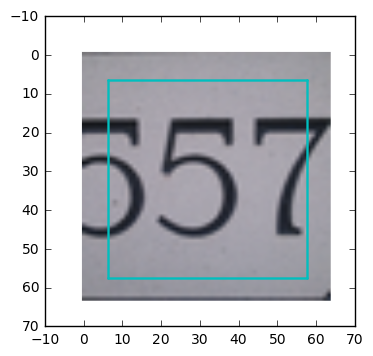

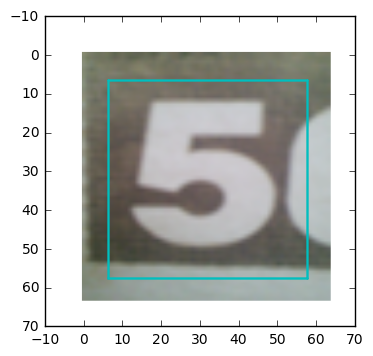

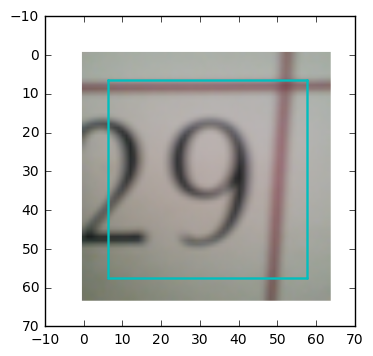

In [124]:
from IPython.display import Image as iImage, display

picfolder_path = "./Pics"
pic_paths = os.listdir(picfolder_path)

resized = []

for i in range(5):
    img = Image.open(os.path.join(picfolder_path, pic_paths[i]))
    resized.extend([img.resize((64, 64),Image.ANTIALIAS)])
    resized[i] = np.array(resized[i])

resized = np.array(resized)

graph = tf.Graph()

with graph.as_default():
    # Input
    tf_test_dataset = tf.placeholder(tf.float32, shape=[5,64,64,3])
    
    # Variables
    weight_layer1 = tf.get_variable("ConvW1", shape=[patch_size, patch_size, 
        num_channels, depth1], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer1 = tf.Variable(tf.constant(1.0, shape=[depth1]))
    
    weight_layer2 = tf.get_variable("ConvW2", shape=[patch_size, patch_size, 
        depth1, depth2], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer2 = tf.Variable(tf.constant(1.0, shape=[depth2]))
    
    weight_layer3 = tf.get_variable("ConvW3", shape=[patch_size, patch_size, 
        depth2, depth3], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer3 = tf.Variable(tf.constant(1.0, shape=[depth3]))
    
    weight_layer4 = tf.get_variable("ConvW4", shape=[patch_size, patch_size, 
        depth3, depth4], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer4 = tf.Variable(tf.constant(1.0, shape=[depth4]))
    
    weight_layer5 = tf.get_variable("FcW1", shape=[4 * 4 * depth4, num_outputs], initializer=tf.contrib.layers.xavier_initializer())
    bias_layer5 = tf.Variable(tf.constant(1.0, shape=[num_outputs]))
    
    # Model
    def model(data, ):
        conv1 = tf.nn.conv2d(data, weight_layer1, [1,2,2,1], padding='SAME')
        hidden1 = tf.nn.relu(conv1 + bias_layer1)
        
        conv2 = tf.nn.conv2d(hidden1, weight_layer2, [1,2,2,1], padding='SAME')
        hidden2 = tf.nn.relu(conv2 + bias_layer2)
        
        conv3 = tf.nn.conv2d(hidden2, weight_layer3, [1,2,2,1], padding='SAME')
        hidden3 = tf.nn.relu(conv3 + bias_layer3)
        
        conv4 = tf.nn.conv2d(hidden3, weight_layer4, [1,2,2,1], padding='SAME')
        hidden4 = tf.nn.relu(conv4 + bias_layer4)
        
        shape = hidden4.get_shape().as_list()
        reshape = tf.reshape(hidden4, [-1, shape[1]*shape[2]*shape[3]])
        
        return tf.nn.relu(tf.matmul(reshape, weight_layer5) + bias_layer5)
    
    # Training computation
    logits = model(tf_test_dataset)
    test_prediction = tf.nn.softmax(logits)
    
    saver = tf.train.Saver()

with tf.Session(graph=graph) as session:
    saver.restore(session, tf.train.latest_checkpoint('./tensorflowcheckpoints/'))
    test_prediction = session.run(test_prediction, feed_dict={tf_test_dataset : resized})
    
    for i,img in enumerate(resized):
        plt.imshow(img)
        for j in range(5):
        
            left = test_prediction[i][4*j + 0] * 128
            top = test_prediction[i][4*j + 1] * 128
            width = test_prediction[i][4*j + 2] * 128
            height = test_prediction[i][4*j + 3] * 128
    
            plt.plot([left, left], [top, top + height], 'c')
            plt.plot([left, left+width], [top, top], 'c')
            plt.plot([left+width, left+width], [top, top+height], 'c')
            plt.plot([left, left+width], [top+height, top+height], 'c')
            
        plt.show()


**Answer:**

The model seems to work fairly well on images captured by my own camera.